In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import scipy as sp
import pickle
from statsmodels.stats.weightstats import ztest
import json
from scipy.stats import kstest, norm, kruskal, chi

In [2]:
def saveresults(results, measure, perf, algorithm, name_experiment):
    path='../Figures/Wilcoxon/'+name_experiment+'_'+measure+'_'+perf+'_'+algorithm+'.csv';
    with open(path, 'w+') as fp:
        json.dump(results, fp);    

In [3]:
%run ../Classes/xvalidation.py
%run ../Classes/Imbalance_Plotter.py
%run ../Classes/BuildMyBulle.py

## Separating per algorithms

In [4]:
xvalidations=[[],[],[],[],[]];


datasets = [ 'haberman', 'magic', 'pulsar', 'tictactoe'];
suffixes = ['_dt.txt', '_knn.txt', 'rf.txt', '_sgd.txt', '_svc.txt'];
name_experiment='normCats_realSnowBubblesTimes15_ray10bis_RealSmote'

for dataset in datasets:
    for suffix in range(0, len(suffixes)):
        path = '../Algorithms_Scores/experimentdouble_'+dataset+'_'+name_experiment+suffixes[suffix];
        with open(path, 'rb') as fp:
            xvalidations[suffix].append(pickle.load(fp));
            fp.close();
        
        
typeDs = ['Maxi', 'Midi', 'Mini','Tiny'];
imbL = [ '_Eighty', '_Eighty5', '_Ninety', '_Ninety5']
suffixes = ['_dt.py', '_knn.py', '_rf.py', '_sgd.py', '_svc.py'];

imbs = [];

for typeD in typeDs:
    for suffix in range(0, len(suffixes)):
        for imbl in imbL:
            path = '../Algorithms_Scores/'+name_experiment+typeD+imbl+suffixes[suffix];
            with open(path, 'rb') as fp:
                xvalidations[suffix].append(pickle.load(fp))


## Append All Scores
### Decision Trees

In [6]:
averagePrecisions_dt={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
precisions_dt={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
recalls_dt={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
f1scores_dt={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
aucs_dt={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
praucs_dt={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};

for xval in xvalidations[0]:
    print('huh')
    averagePrecisionz=xval.averagePrecision;
    praucz=xval.prAucs;
    precisionz=xval.precisions0;
    recallz=xval.recalls0;
    f1scorez=xval.f1scores0;
    aucz=xval.aucs;
    
    averagePrecisions_dt['original']+=averagePrecisionz[0]
    averagePrecisions_dt['oversample']+=averagePrecisionz[1];
    averagePrecisions_dt['oversample_bubble']+=averagePrecisionz[2];
    averagePrecisions_dt['oversample_bubble_original']+=averagePrecisionz[3]
    averagePrecisions_dt['smote']+=averagePrecisionz[4];
    
    precisions_dt['original']+=precisionz[0];
    precisions_dt['oversample']+=precisionz[1];
    precisions_dt['oversample_bubble']+=precisionz[2];
    precisions_dt['oversample_bubble_original']+=precisionz[3];
    precisions_dt['smote']+=precisionz[4];
    
    recalls_dt['original']+=recallz[0];
    recalls_dt['oversample']+=recallz[1];
    recalls_dt['oversample_bubble']+=recallz[2]
    recalls_dt['oversample_bubble_original']+=recallz[3]
    recalls_dt['smote']+=recallz[4];
    
    f1scores_dt['original']+=f1scorez[0];
    f1scores_dt['oversample']+=f1scorez[1];
    f1scores_dt['oversample_bubble']+=f1scorez[2]
    f1scores_dt['oversample_bubble_original']+=f1scorez[3]
    f1scores_dt['smote']+=f1scorez[4];
    
    aucs_dt['original']+=aucz[0];
    aucs_dt['oversample']+=aucz[1];
    aucs_dt['oversample_bubble']+=aucz[2];
    aucs_dt['oversample_bubble_original']+=aucz[3];
    aucs_dt['smote']+=aucz[4]
    
    praucs_dt['original']+=praucz[0];
    praucs_dt['oversample']+=praucz[1];
    praucs_dt['oversample_bubble']+=praucz[2];
    praucs_dt['oversample_bubble_original']+=praucz[3];
    praucs_dt['smote']+=praucz[4]


huh
huh
huh
huh
huh
huh
huh
huh
huh
huh
huh
huh
huh
huh
huh
huh
huh
huh
huh
huh


### K Nearest Neighbours

In [7]:
precisions_knn={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
recalls_knn={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
f1scores_knn={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
aucs_knn={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
praucs_knn={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
averagePrecisions_knn={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};

for xval in xvalidations[1]:
    averagePrecisionz=xval.averagePrecision
    precisionz=xval.precisions0;
    recallz=xval.recalls0;
    f1scorez=xval.f1scores0;
    aucz=xval.aucs;
    praucz=xval.prAucs;
    
   
    averagePrecisions_knn['original']+=averagePrecisionz[0]
    averagePrecisions_knn['oversample']+=averagePrecisionz[1];
    averagePrecisions_knn['oversample_bubble']+=averagePrecisionz[2];
    averagePrecisions_knn['oversample_bubble_original']+=averagePrecisionz[3]
    averagePrecisions_knn['smote']+=averagePrecisionz[4];
    
    precisions_knn['original']+=precisionz[0];
    precisions_knn['oversample']+=precisionz[1];
    precisions_knn['oversample_bubble']+=precisionz[2];
    precisions_knn['oversample_bubble_original']+=precisionz[3];
    precisions_knn['smote']+=precisionz[4];
    
    recalls_knn['original']+=recallz[0];
    recalls_knn['oversample']+=recallz[1];
    recalls_knn['oversample_bubble']+=recallz[2]
    recalls_knn['oversample_bubble_original']+=recallz[3]
    recalls_knn['smote']+=recallz[4];
    
    f1scores_knn['original']+=f1scorez[0];
    f1scores_knn['oversample']+=f1scorez[1];
    f1scores_knn['oversample_bubble']+=f1scorez[2]
    f1scores_knn['oversample_bubble_original']+=f1scorez[3]
    f1scores_knn['smote']+=f1scorez[4];
    
    aucs_knn['original']+=aucz[0];
    aucs_knn['oversample']+=aucz[1];
    aucs_knn['oversample_bubble']+=aucz[2];
    aucs_knn['oversample_bubble_original']+=aucz[3];
    aucs_knn['smote']+=aucz[4]
    
    praucs_knn['original']+=praucz[0];
    praucs_knn['oversample']+=praucz[1];
    praucs_knn['oversample_bubble']+=praucz[2];
    praucs_knn['oversample_bubble_original']+=praucz[3];
    praucs_knn['smote']+=praucz[4]


### Random Forest

In [8]:
precisions_rf={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
recalls_rf={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
f1scores_rf={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
aucs_rf={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
praucs_rf={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
averagePrecisions_rf={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};

for xval in xvalidations[2]:
    averagePrecisionz=xval.averagePrecision;
    precisionz=xval.precisions0;
    recallz=xval.recalls0;
    f1scorez=xval.f1scores0;
    aucz=xval.aucs;
    praucz=xval.prAucs;
    
    averagePrecisions_rf['original']+=averagePrecisionz[0]
    averagePrecisions_rf['oversample']+=averagePrecisionz[1];
    averagePrecisions_rf['oversample_bubble']+=averagePrecisionz[2];
    averagePrecisions_rf['oversample_bubble_original']+=averagePrecisionz[3]
    averagePrecisions_rf['smote']+=averagePrecisionz[4];
    
    precisions_rf['original']+=precisionz[0];
    precisions_rf['oversample']+=precisionz[1];
    precisions_rf['oversample_bubble']+=precisionz[2];
    precisions_rf['oversample_bubble_original']+=precisionz[3];
    precisions_rf['smote']+=precisionz[4];
    
    recalls_rf['original']+=recallz[0];
    recalls_rf['oversample']+=recallz[1];
    recalls_rf['oversample_bubble']+=recallz[2]
    recalls_rf['oversample_bubble_original']+=recallz[3]
    recalls_rf['smote']+=recallz[4];
    
    f1scores_rf['original']+=f1scorez[0];
    f1scores_rf['oversample']+=f1scorez[1];
    f1scores_rf['oversample_bubble']+=f1scorez[2]
    f1scores_rf['oversample_bubble_original']+=f1scorez[3]
    f1scores_rf['smote']+=f1scorez[4];
    
    aucs_rf['original']+=aucz[0];
    aucs_rf['oversample']+=aucz[1];
    aucs_rf['oversample_bubble']+=aucz[2];
    aucs_rf['oversample_bubble_original']+=aucz[3];
    aucs_rf['smote']+=aucz[4]
    
    praucs_rf['original']+=praucz[0];
    praucs_rf['oversample']+=praucz[1];
    praucs_rf['oversample_bubble']+=praucz[2];
    praucs_rf['oversample_bubble_original']+=praucz[3];
    praucs_rf['smote']+=praucz[4]


### Stochastic Gradient Descent

In [9]:
precisions_sgd={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
recalls_sgd={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
f1scores_sgd={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
aucs_sgd={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
praucs_sgd={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
averagePrecisions_sgd={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};

for xval in xvalidations[3]:
    averagePrecisionz=xval.averagePrecision;
    precisionz=xval.precisions0;
    recallz=xval.recalls0;
    f1scorez=xval.f1scores0;
    aucz=xval.aucs;
    praucz=xval.prAucs;
    
    averagePrecisions_sgd['original']+=averagePrecisionz[0]
    averagePrecisions_sgd['oversample']+=averagePrecisionz[1];
    averagePrecisions_sgd['oversample_bubble']+=averagePrecisionz[2];
    averagePrecisions_sgd['oversample_bubble_original']+=averagePrecisionz[3]
    averagePrecisions_sgd['smote']+=averagePrecisionz[4];
    
    precisions_sgd['original']+=precisionz[0];
    precisions_sgd['oversample']+=precisionz[1];
    precisions_sgd['oversample_bubble']+=precisionz[2];
    precisions_sgd['oversample_bubble_original']+=precisionz[3];
    precisions_sgd['smote']+=precisionz[4];
    
    recalls_sgd['original']+=recallz[0];
    recalls_sgd['oversample']+=recallz[1];
    recalls_sgd['oversample_bubble']+=recallz[2]
    recalls_sgd['oversample_bubble_original']+=recallz[3]
    recalls_sgd['smote']+=recallz[4];
    
    f1scores_sgd['original']+=f1scorez[0];
    f1scores_sgd['oversample']+=f1scorez[1];
    f1scores_sgd['oversample_bubble']+=f1scorez[2]
    f1scores_sgd['oversample_bubble_original']+=f1scorez[3]
    f1scores_sgd['smote']+=f1scorez[4];
    
    aucs_sgd['original']+=aucz[0];
    aucs_sgd['oversample']+=aucz[1];
    aucs_sgd['oversample_bubble']+=aucz[2];
    aucs_sgd['oversample_bubble_original']+=aucz[3];
    aucs_sgd['smote']+=aucz[4]

    praucs_sgd['original']+=praucz[0];
    praucs_sgd['oversample']+=praucz[1];
    praucs_sgd['oversample_bubble']+=praucz[2];
    praucs_sgd['oversample_bubble_original']+=praucz[3];
    praucs_sgd['smote']+=praucz[4]


### Support Vector Machine

In [10]:
precisions_svm={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
recalls_svm={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
f1scores_svm={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
aucs_svm={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
praucs_svm={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};
averagePrecisions_svm={'original':[], 'oversample':[], 'oversample_bubble':[], 'oversample_bubble_original':[], 'smote':[]};


for xval in xvalidations[4]:
    averagePrecisionz=xval.averagePrecision;
    precisionz=xval.precisions0;
    recallz=xval.recalls0;
    f1scorez=xval.f1scores0;
    aucz=xval.aucs;
    praucz=xval.prAucs;
    
    averagePrecisions_svm['original']+=averagePrecisionz[0]
    averagePrecisions_svm['oversample']+=averagePrecisionz[1];
    averagePrecisions_svm['oversample_bubble']+=averagePrecisionz[2];
    averagePrecisions_svm['oversample_bubble_original']+=averagePrecisionz[3]
    averagePrecisions_svm['smote']+=averagePrecisionz[4];
    
    precisions_svm['original']+=precisionz[0];
    precisions_svm['oversample']+=precisionz[1];
    precisions_svm['oversample_bubble']+=precisionz[2];
    precisions_svm['oversample_bubble_original']+=precisionz[3];
    precisions_svm['smote']+=precisionz[4];
    
    recalls_svm['original']+=recallz[0];
    recalls_svm['oversample']+=recallz[1];
    recalls_svm['oversample_bubble']+=recallz[2]
    recalls_svm['oversample_bubble_original']+=recallz[3]
    recalls_svm['smote']+=recallz[4];
    
    f1scores_svm['original']+=f1scorez[0];
    f1scores_svm['oversample']+=f1scorez[1];
    f1scores_svm['oversample_bubble']+=f1scorez[2]
    f1scores_svm['oversample_bubble_original']+=f1scorez[3]
    f1scores_svm['smote']+=f1scorez[4];
    
    aucs_svm['original']+=aucz[0];
    aucs_svm['oversample']+=aucz[1];
    aucs_svm['oversample_bubble']+=aucz[2];
    aucs_svm['oversample_bubble_original']+=aucz[3];
    aucs_svm['smote']+=aucz[4]
    
    praucs_svm['original']+=praucz[0];
    praucs_svm['oversample']+=praucz[1];
    praucs_svm['oversample_bubble']+=praucz[2];
    praucs_svm['oversample_bubble_original']+=praucz[3];
    praucs_svm['smote']+=praucz[4]


In [19]:
names_measures=['precisions', 'recalls', 'f1scores', 'aucs', 'praucs'];
name_datasets=['original', 'oversample', 'oversample_bubble', 'oversample_bubble_original', 'smote'];
name_algorithms=['Decision Trees', 'K Nearest Neighbour', 'Random Forest', 'Stochastic Gradient Descent', 'Support Vector Machine']
measures_dt=[precisions_dt, recalls_dt, f1scores_dt, aucs_dt, praucs_dt]; #DT
measures_knn=[precisions_knn, recalls_knn, f1scores_knn, aucs_knn, praucs_knn]; #KNN
measures_rf=[precisions_rf, recalls_rf, f1scores_rf, aucs_rf, praucs_rf]; #RF
measures_sgd=[precisions_sgd, recalls_sgd, f1scores_sgd, aucs_sgd, praucs_sgd]; #SGD
measures_svm=[precisions_svm, recalls_svm, f1scores_svm, aucs_svm, praucs_svm]; #SVM

## Difference Accuracies
### DT

In [18]:
len(measures_dt)

6

In [20]:
diff_precs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_recs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_f1s_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_aucs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_praucs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_averagePrecisions_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

diff_measures_dt=[diff_precs_dt, diff_recs_dt, diff_f1s_dt, diff_aucs_dt, diff_praucs_dt];

for measure in range(0, len(measures_dt)):
    for name_meaj in range(0, len(name_datasets)):
        for name2_meaj in range(0, len(name_datasets)):
            diff_measures_dt[measure][name_datasets[name_meaj]][name2_meaj]=np.subtract(measures_dt[measure][name_datasets[name_meaj]], measures_dt[measure][name_datasets[name2_meaj]])
#             plt.hist(diff_measures_dt[measure][name_datasets[name_meaj]][name2_meaj])
#             plt.title(("Histogram for differences between " + name_datasets[name_meaj] + "and "+name_datasets[name2_meaj]) + "for Decision Trees");
#             plt.show();
            
            

### K Nearest Neighbours

In [22]:
diff_precs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_recs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_f1s_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_aucs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_praucs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

diff_measures_knn=[diff_precs_knn, diff_recs_knn, diff_f1s_knn, diff_aucs_knn, diff_praucs_knn];

for measure in range(0, len(measures_knn)):
    for name_meaj in range(0, len(name_datasets)):
        for name2_meaj in range(0, len(name_datasets)):
            diff_measures_knn[measure][name_datasets[name_meaj]][name2_meaj]=np.subtract(measures_knn[measure][name_datasets[name_meaj]], measures_knn[measure][name_datasets[name2_meaj]])
#             plt.hist(diff_measures_knn[measure][name_datasets[name_meaj]][name2_meaj])
#             plt.title(("Histogram for differences between " + name_datasets[name_meaj] + "and "+name_datasets[name2_meaj]+"for K Nearest Neighbours"));
#             plt.show();
            
            

### Random Forest

In [23]:
diff_precs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_recs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_f1s_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_aucs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_praucs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

diff_measures_rf=[diff_precs_rf, diff_recs_rf, diff_f1s_rf, diff_aucs_rf, diff_praucs_rf];

for measure in range(0, len(measures_rf)):
    for name_meaj in range(0, len(name_datasets)):
        for name2_meaj in range(0, len(name_datasets)):
            diff_measures_rf[measure][name_datasets[name_meaj]][name2_meaj]=np.subtract(measures_rf[measure][name_datasets[name_meaj]], measures_rf[measure][name_datasets[name2_meaj]])
#             plt.hist(diff_measures_rf[measure][name_datasets[name_meaj]][name2_meaj])
#             plt.title(("Histogram for differences between " + name_datasets[name_meaj] + "and "+name_datasets[name2_meaj] + "for Random Forest"));
#             plt.show();
            
            

### Stochastic Gradient Descent

In [24]:
diff_precs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_recs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_f1s_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_aucs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_praucs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

diff_measures_sgd=[diff_precs_sgd, diff_recs_sgd, diff_f1s_sgd, diff_aucs_sgd, diff_praucs_sgd];

for measure in range(0, len(measures_sgd)):
    for name_meaj in range(0, len(name_datasets)):
        for name2_meaj in range(0, len(name_datasets)):
            diff_measures_sgd[measure][name_datasets[name_meaj]][name2_meaj]=np.subtract(measures_sgd[measure][name_datasets[name_meaj]], measures_sgd[measure][name_datasets[name2_meaj]])
#             plt.hist(diff_measures_sgd[measure][name_datasets[name_meaj]][name2_meaj])
#             plt.title(("Histogram for differences between " + name_datasets[name_meaj] + " and "+name_datasets[name2_meaj]+" for Stochastic Gradient Descent"));
#             plt.show();
            
            

### Support Vector Machine

In [25]:
diff_precs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_recs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_f1s_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_aucs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
diff_praucs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

diff_measures_svm=[diff_precs_svm, diff_recs_svm, diff_f1s_svm, diff_aucs_svm, diff_praucs_svm];

for measure in range(0, len(measures_svm)):
    for name_meaj in range(0, len(name_datasets)):
        for name2_meaj in range(0, len(name_datasets)):
            diff_measures_svm[measure][name_datasets[name_meaj]][name2_meaj]=np.subtract(measures_svm[measure][name_datasets[name_meaj]], measures_svm[measure][name_datasets[name2_meaj]])
#             plt.hist(diff_measures_svm[measure][name_datasets[name_meaj]][name2_meaj])
#             plt.title(("Histogram for differences between " + name_datasets[name_meaj] + " and "+name_datasets[name2_meaj]+' for Support Vector Machine'));
#             plt.show();
            
            

## Wilcoxon Tests
### Decision Trees

In [18]:
wilcox_precs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_recs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_f1s_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_aucs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_praucs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_averagePrecisions_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

ps_precs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_recs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_f1s_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_aucs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_praucs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_averagePrecisions_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

ts_precs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_recs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_f1s_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_aucs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_praucs_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_averagePrecisions_dt={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

wilcox_measures_dt=[wilcox_averagePrecisions_dt, wilcox_precs_dt, wilcox_recs_dt, wilcox_f1s_dt, wilcox_aucs_dt, wilcox_praucs_dt];
ps_measures_dt=[ps_averagePrecisions_dt, ps_precs_dt, ps_recs_dt, ps_f1s_dt, ps_aucs_dt, ps_praucs_dt];
ts_measures_dt=[ts_averagePrecisions_dt, ts_precs_dt, ts_recs_dt, ts_f1s_dt, ts_aucs_dt, ts_praucs_dt];

for measure in range(0, len(measures_dt)):
    for name_meaj in range(0, len(name_datasets)):
        for name2_meaj in range(0, len(name_datasets)):
            wilcox_dt = sp.stats.wilcoxon(diff_measures_dt[measure][name_datasets[name_meaj]][name2_meaj],zero_method="zsplit")
            wilcox_measures_dt[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_dt;
            ps_measures_dt[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_dt.pvalue;
            ts_measures_dt[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_dt.statistic;
            

In [19]:
pd.DataFrame(ps_measures_dt[0])
saveresults(ps_measures_dt[0], 'p', 'averagePrecisions', 'dt', name_experiment)

In [20]:
pd.DataFrame(ps_measures_dt[1])
saveresults(ps_measures_dt[1],'p', 'precision', 'dt', name_experiment)

In [21]:
pd.DataFrame(ps_measures_dt[2])
saveresults(ps_measures_dt[2],'p', 'recall', 'dt', name_experiment)

In [22]:
pd.DataFrame(ps_measures_dt[3])
saveresults(ps_measures_dt[3],'p', 'f1', 'dt', name_experiment)

In [23]:
pd.DataFrame(ps_measures_dt[4])
saveresults(ps_measures_dt[4], 'p', 'auc', 'dt', name_experiment)

In [24]:
pd.DataFrame(ps_measures_dt[5])
saveresults(ps_measures_dt[5], 'p','prauc', 'dt', name_experiment)

### K Nearest Neighbours

In [25]:
wilcox_precs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_recs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_f1s_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_aucs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_praucs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_avPrecisions_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

ps_avPrecisions_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_precs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_recs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_f1s_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_aucs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_praucs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

ts_precs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_recs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_f1s_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_aucs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_praucs_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_avPrecisions_knn={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

wilcox_measures_knn=[wilcox_avPrecisions_knn, wilcox_precs_knn, wilcox_recs_knn, wilcox_f1s_knn, wilcox_aucs_knn, wilcox_praucs_knn];
ps_measures_knn=[ps_avPrecisions_knn, ps_precs_knn, ps_recs_knn, ps_f1s_knn, ps_aucs_knn, ps_praucs_knn];
ts_measures_knn=[ts_avPrecisions_knn, ts_precs_knn, ts_recs_knn, ts_f1s_knn, ts_aucs_knn, ts_praucs_knn];

for measure in range(0, len(measures_knn)):
    for name_meaj in range(0, len(name_datasets)):
        for name2_meaj in range(0, len(name_datasets)):
            wilcox_knn = sp.stats.wilcoxon(diff_measures_knn[measure][name_datasets[name_meaj]][name2_meaj],zero_method="zsplit")
            wilcox_measures_knn[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_knn;
            ps_measures_knn[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_knn.pvalue;
            ts_measures_knn[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_knn.statistic;
            

In [26]:
pd.DataFrame(ps_measures_knn[0])
saveresults(ps_measures_knn[0], 'p', 'averagePrecisions', 'knn',name_experiment)

In [27]:
pd.DataFrame(ps_measures_knn[1])
saveresults(ps_measures_knn[1],'p', 'precision', 'knn', name_experiment)

In [28]:
pd.DataFrame(ps_measures_knn[2])
saveresults(ps_measures_knn[2],'p', 'recall', 'knn', name_experiment)

In [29]:
pd.DataFrame(ps_measures_knn[3])
saveresults(ps_measures_knn[3],'p', 'f1', 'knn', name_experiment)

In [30]:
pd.DataFrame(ps_measures_knn[4])
saveresults(ps_measures_knn[4], 'p', 'auc', 'knn', name_experiment)

In [31]:
pd.DataFrame(ps_measures_knn[5])
saveresults(ps_measures_knn[5], 'p', 'prauc', 'knn', name_experiment)

### Random Forest

In [32]:
wilcox_avPrecisions_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_precs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_recs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_f1s_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_aucs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_praucs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

ps_avPrecisions_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_precs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_recs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_f1s_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_aucs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_praucs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

ts_avPrecisions_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_precs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_recs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_f1s_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_aucs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_praucs_rf={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

wilcox_measures_rf=[wilcox_avPrecisions_rf, wilcox_precs_rf, wilcox_recs_rf, wilcox_f1s_rf, wilcox_aucs_rf, wilcox_praucs_rf];
ps_measures_rf=[ps_avPrecisions_rf, ps_precs_rf, ps_recs_rf, ps_f1s_rf, ps_aucs_rf, ps_praucs_rf];
ts_measures_rf=[ts_avPrecisions_rf, ts_precs_rf, ts_recs_rf, ts_f1s_rf, ts_aucs_rf, ts_praucs_rf];

for measure in range(0, len(measures_rf)):
    for name_meaj in range(0, len(name_datasets)):
        for name2_meaj in range(0, len(name_datasets)):
            wilcox_rf = sp.stats.wilcoxon(diff_measures_rf[measure][name_datasets[name_meaj]][name2_meaj],zero_method="zsplit")
            wilcox_measures_rf[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_rf;
            ps_measures_rf[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_rf.pvalue;
            ts_measures_rf[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_rf.statistic;
            

In [33]:
pd.DataFrame(ps_measures_rf[0])
saveresults(ps_measures_rf[0], 'p','averagePrecisions', 'rf', name_experiment)

In [34]:
pd.DataFrame(ps_measures_rf[1])
saveresults(ps_measures_rf[1], 'p', 'precision', 'rf', name_experiment)

In [35]:
pd.DataFrame(ps_measures_rf[2])
saveresults(ps_measures_rf[2], 'p', 'recall', 'rf', name_experiment)

In [36]:
pd.DataFrame(ps_measures_rf[3])
saveresults(ps_measures_rf[3], 'p', 'f1', 'rf', name_experiment)

In [37]:
pd.DataFrame(ps_measures_rf[4])
saveresults(ps_measures_rf[4], 'p', 'auc', 'rf', name_experiment)

In [38]:
pd.DataFrame(ps_measures_rf[5])
saveresults(ps_measures_rf[5], 'p', 'prauc', 'rf', name_experiment)

### Stochastic Gradient Descent

In [39]:
wilcox_avPrecisions_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_precs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_recs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_f1s_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_aucs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_praucs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

ps_avPrecisions_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_precs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_recs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_f1s_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_aucs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_praucs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

ts_avPrecisions_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_precs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_recs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_f1s_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_aucs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_praucs_sgd={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

wilcox_measures_sgd=[wilcox_avPrecisions_sgd, wilcox_precs_sgd, wilcox_recs_sgd, wilcox_f1s_sgd, wilcox_aucs_sgd, wilcox_praucs_sgd];
ps_measures_sgd=[ps_avPrecisions_sgd, ps_precs_sgd, ps_recs_sgd, ps_f1s_sgd, ps_aucs_sgd, ps_praucs_sgd];
ts_measures_sgd=[ts_avPrecisions_sgd, ts_precs_sgd, ts_recs_sgd, ts_f1s_sgd, ts_aucs_sgd, ts_praucs_sgd];

for measure in range(0, len(measures_sgd)):
    for name_meaj in range(0, len(name_datasets)):
        for name2_meaj in range(0, len(name_datasets)):
            wilcox_sgd = sp.stats.wilcoxon(diff_measures_sgd[measure][name_datasets[name_meaj]][name2_meaj],zero_method="zsplit")
            wilcox_measures_sgd[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_sgd;
            ps_measures_sgd[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_sgd.pvalue;
            ts_measures_sgd[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_sgd.statistic;
            

In [40]:
pd.DataFrame(ps_measures_sgd[0])
saveresults(ps_measures_sgd[0],'p', 'averagePrecisions', 'sgd', name_experiment)

In [41]:
pd.DataFrame(ps_measures_sgd[1])
saveresults(ps_measures_sgd[1], 'p', 'precision', 'sgd', name_experiment)

In [42]:
pd.DataFrame(ps_measures_sgd[2])
saveresults(ps_measures_sgd[2], 'p', 'recall', 'sgd', name_experiment)

In [43]:
pd.DataFrame(ps_measures_sgd[3])
saveresults(ps_measures_sgd[3], 'p', 'f1', 'sgd', name_experiment)

In [44]:
pd.DataFrame(ps_measures_sgd[4])
saveresults(ps_measures_sgd[4], 'p','auc', 'sgd', name_experiment)

In [45]:
pd.DataFrame(ps_measures_sgd[5])
saveresults(ps_measures_sgd[5], 'p', 'prauc', 'sgd', name_experiment)

### Support Vector Machine

In [46]:
wilcox_avPrecisions_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_precs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_recs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_f1s_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_aucs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
wilcox_praucs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

ps_avPrecisions_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_precs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_recs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_f1s_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_aucs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ps_praucs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

ts_avPrecisions_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_precs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_recs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_f1s_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_aucs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};
ts_praucs_svm={'original':[0,0,0,0,0], 'oversample':[0,0,0,0,0], 'oversample_bubble':[0,0,0,0,0], 'oversample_bubble_original':[0,0,0,0,0], 'smote':[0,0,0,0,0]};

wilcox_measures_svm=[wilcox_avPrecisions_svm, wilcox_precs_svm, wilcox_recs_svm, wilcox_f1s_svm, wilcox_aucs_svm, wilcox_praucs_svm];
ps_measures_svm=[ps_avPrecisions_svm, ps_precs_svm, ps_recs_svm, ps_f1s_svm, ps_aucs_svm, ps_praucs_svm];
ts_measures_svm=[ts_avPrecisions_svm, ts_precs_svm, ts_recs_svm, ts_f1s_svm, ts_aucs_svm, ts_praucs_svm];

for measure in range(0, len(measures_svm)):
    for name_meaj in range(0, len(name_datasets)):
        for name2_meaj in range(0, len(name_datasets)):
            wilcox_svm = sp.stats.wilcoxon(diff_measures_svm[measure][name_datasets[name_meaj]][name2_meaj],zero_method="zsplit")
            wilcox_measures_svm[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_svm;
            ps_measures_svm[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_svm.pvalue;
            ts_measures_svm[measure][name_datasets[name_meaj]][name2_meaj] = wilcox_svm.statistic;
            

In [47]:
pd.DataFrame(ps_measures_svm[0])
saveresults(ps_measures_svm[0], 'p','averagePrecisions', 'svm', name_experiment)

In [48]:
pd.DataFrame(ps_measures_svm[1])
saveresults(ps_measures_svm[1], 'p', 'precision', 'svm', name_experiment)

In [49]:
pd.DataFrame(ps_measures_svm[2])
saveresults(ps_measures_svm[2], 'p', 'recall', 'svm', name_experiment)

In [50]:
pd.DataFrame(ps_measures_svm[3])
saveresults(ps_measures_svm[3], 'p', 'f1', 'svm', name_experiment)

In [51]:
pd.DataFrame(ps_measures_svm[4])
saveresults(ps_measures_svm[4], 'p','auc', 'svm', name_experiment)

In [52]:
pd.DataFrame(ps_measures_svm[5])
saveresults(ps_measures_svm[5], 'p', 'prauc', 'svm', name_experiment)

# Kolmogorov Test

In [27]:
precisions_liste = [precisions_dt, precisions_knn, precisions_rf, precisions_sgd, precisions_svm];
recalls_liste = [recalls_dt, recalls_knn, recalls_rf, recalls_sgd, recalls_svm];
f1scores_liste = [f1scores_dt, f1scores_knn, f1scores_rf, f1scores_sgd, f1scores_svm];
aucs_liste = [aucs_dt, aucs_knn, aucs_rf, aucs_sgd, aucs_svm]
praucs_liste = [praucs_dt, praucs_knn, praucs_rf, praucs_sgd, praucs_svm]
listes =[precisions_liste, recalls_liste, f1scores_liste, aucs_liste, praucs_liste];

measureL_name = ['precision', 'recall', 'f1 score', 'auc', 'praucs'];
algL_name= ['Decision Tree', 'KNN', 'Random Forest', 'Stochastic Gradient Descent', 'Support Vector Machine'];

## Normal Distribution

In [28]:
for measure in range(0, len(measureL_name)):
    for algorithm in range(0, len(algL_name)):
        for method in listes[measure][algorithm]:
            
            loc, scale = norm.fit(listes[measure][algorithm][method])
            n = norm(loc=loc, scale=scale)
            
            kst = kstest(listes[measure][algorithm][method], n.cdf, mode='approx');
            
            print(kst.pvalue, ': ', measureL_name[measure], ' ', algL_name[algorithm])

0.975128135304 :  precision   Decision Tree
0.929002931732 :  precision   Decision Tree
0.667909608276 :  precision   Decision Tree
0.832053372021 :  precision   Decision Tree
0.696271386068 :  precision   Decision Tree
1.14188183531e-06 :  precision   KNN
0.532352906707 :  precision   KNN
0.590621428523 :  precision   KNN
0.846209872015 :  precision   KNN
0.312963912632 :  precision   KNN
3.10504595433e-05 :  precision   Random Forest
0.0667631380268 :  precision   Random Forest
0.00305260831012 :  precision   Random Forest
0.0842378954661 :  precision   Random Forest
0.693190345787 :  precision   Random Forest
0.375279000245 :  precision   Stochastic Gradient Descent
0.00109737975663 :  precision   Stochastic Gradient Descent
0.00132317311785 :  precision   Stochastic Gradient Descent
0.00880706873229 :  precision   Stochastic Gradient Descent
0.000684362915256 :  precision   Stochastic Gradient Descent
1.2619039147e-10 :  precision   Support Vector Machine
0.418023784835 :  precisio

## Chi Distribution

In [130]:
chi.fit(listes[measure][algorithm][method])

(442.93428953614125, -3.3179723215794734, 0.19788597865114793)

In [131]:
for measure in range(0, len(measureL_name)):
    for algorithm in range(0, len(algL_name)):
        for method in listes[measure][algorithm]:
            
            val, loc, scale = chi.fit(listes[measure][algorithm][method])
            c = chi(val, loc=loc, scale=scale)
            
            kst = kstest(listes[measure][algorithm][method], c.cdf, mode='approx');
            
            print(kst.pvalue, ': ', measureL_name[measure], ' ', algL_name[algorithm])

0.010106001448 :  avPrecision   Decision Tree
0.00778744352336 :  avPrecision   Decision Tree
0.105189852595 :  avPrecision   Decision Tree
0.0915171423944 :  avPrecision   Decision Tree
0.0218462110027 :  avPrecision   Decision Tree
5.40896559256e-05 :  avPrecision   KNN
0.035363267062 :  avPrecision   KNN
0.0734127323366 :  avPrecision   KNN
0.0927741522314 :  avPrecision   KNN
5.40896559256e-05 :  avPrecision   KNN
0.000360354271377 :  avPrecision   Random Forest
0.000195396841233 :  avPrecision   Random Forest
0.00257626105652 :  avPrecision   Random Forest
0.00301260449862 :  avPrecision   Random Forest
0.000709953585035 :  avPrecision   Random Forest
0.254932871248 :  avPrecision   Stochastic Gradient Descent
0.0551921739034 :  avPrecision   Stochastic Gradient Descent
0.0935674734214 :  avPrecision   Stochastic Gradient Descent
0.0489963733866 :  avPrecision   Stochastic Gradient Descent
0.155108191745 :  avPrecision   Stochastic Gradient Descent
2.01769453589e-05 :  avPrecision

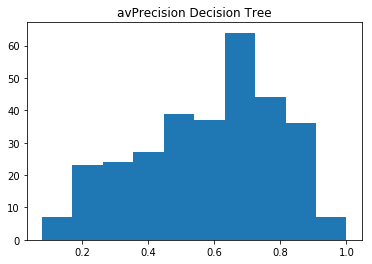

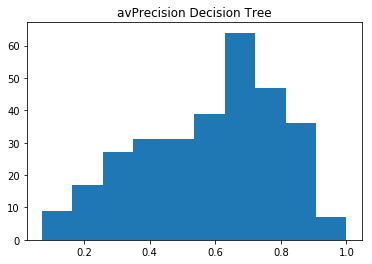

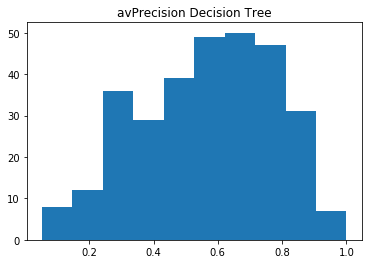

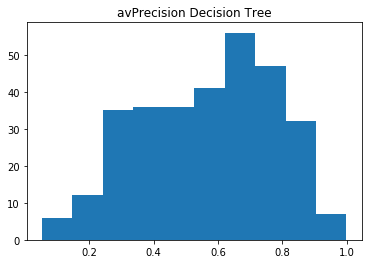

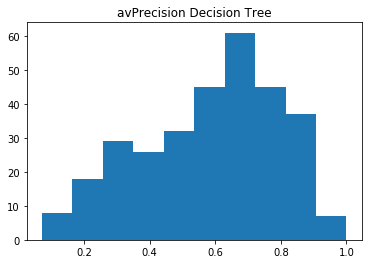

...

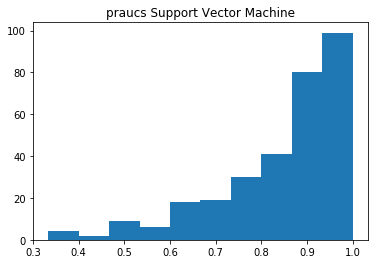

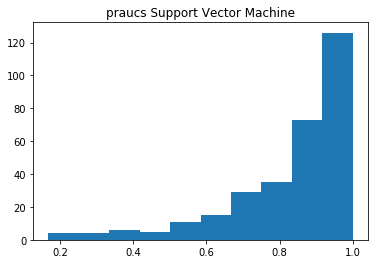

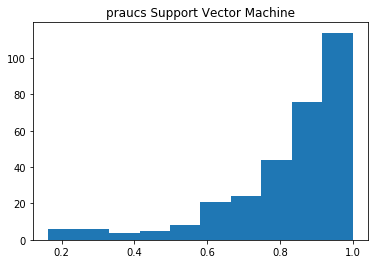

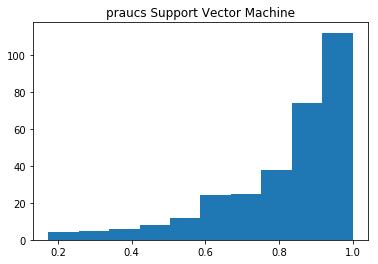

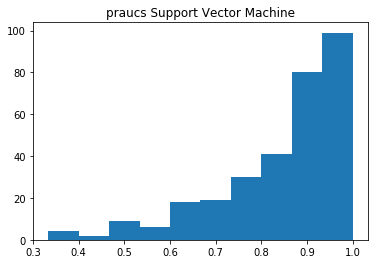

In [132]:
for measure in range(0, len(measureL_name)):
    for algorithm in range(0, len(algL_name)):
        for method in listes[measure][algorithm]:          
            plt.hist(listes[measure][algorithm][method])
            plt.title(measureL_name[measure]+ ' '+ algL_name[algorithm])
            plt.show();
            

# Kruskal-Wallis Test

In [54]:
averagePrecisions_liste = [averagePrecisions_dt, averagePrecisions_knn, averagePrecisions_rf, averagePrecisions_sgd, averagePrecisions_svm];
precisions_liste = [precisions_dt, precisions_knn, precisions_rf, precisions_sgd, precisions_svm];
recalls_liste = [recalls_dt, recalls_knn, recalls_rf, recalls_sgd, recalls_svm];
f1scores_liste = [f1scores_dt, f1scores_knn, f1scores_rf, f1scores_sgd, f1scores_svm];
aucs_liste = [aucs_dt, aucs_knn, aucs_rf, aucs_sgd, aucs_svm]
praucs_liste = [praucs_dt, praucs_knn, praucs_rf, praucs_sgd, praucs_svm]
listes =[averagePrecisions_liste, precisions_liste, recalls_liste, f1scores_liste, aucs_liste, praucs_liste];

measureL_name = ['averagePrecision', 'precision', 'recall', 'f1 score', 'auc', 'prauc'];
algL_name= ['Decision Tree', 'KNN', 'Random Forest', 'Stochastic Gradient Descent', 'Support Vector Machine'];

In [55]:
def plot_kruskal(ori, os, osbbl, osbblori, smote, title):
        x = range(0, len(ori))

        titelfig = '../Figures/Kruskal/'+title+'.png'
        print(title)
        plt.tight_layout()
        
        fig, host = plt.subplots(figsize=(20, 10));
        
        plt.plot(x , ori, color=('#b5e61d'), label="Original")
        plt.plot(x , os, color=("#ee15b8"), label="Random Oversampling")
        plt.plot(x , osbbl, color=("#f86a0c"), label="Original + Oversampling on Bubble")
        plt.plot(x , osbblori, color=("#3ac9a2"), label="Oversampling on Bubble + Original")  
        plt.plot(x , smote, color=("#ff0000"), label="Smote Oversampling")        

       
        plt.savefig(titelfig, format='png');
        plt.legend()
        plt.title(title)
        plt.show();

In [56]:
meaz = ['Acc', 'Precs', 'Recs', 'F1', 'AUCS', 'PRAUCS'];
algz = ['DT', 'KNN', 'RF', 'SGD', 'SVM']
methz = ['original', 'oversample', 'oversample_bubble', 'oversample_bubble_original', 'smote'];
combination = ['01', '02', '03', '04', '12', '13', '14', '23', '24', '34'];


## Decision Trees 

0.690766002453   -   averagePrecision   Decision Tree
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteAcc_DT


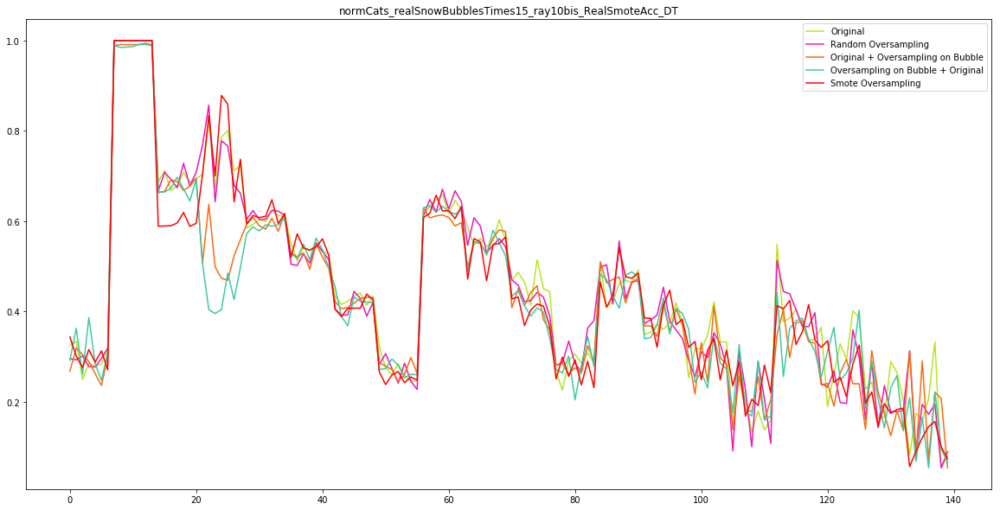

0.000486915184251   -   averagePrecision   KNN
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteAcc_KNN


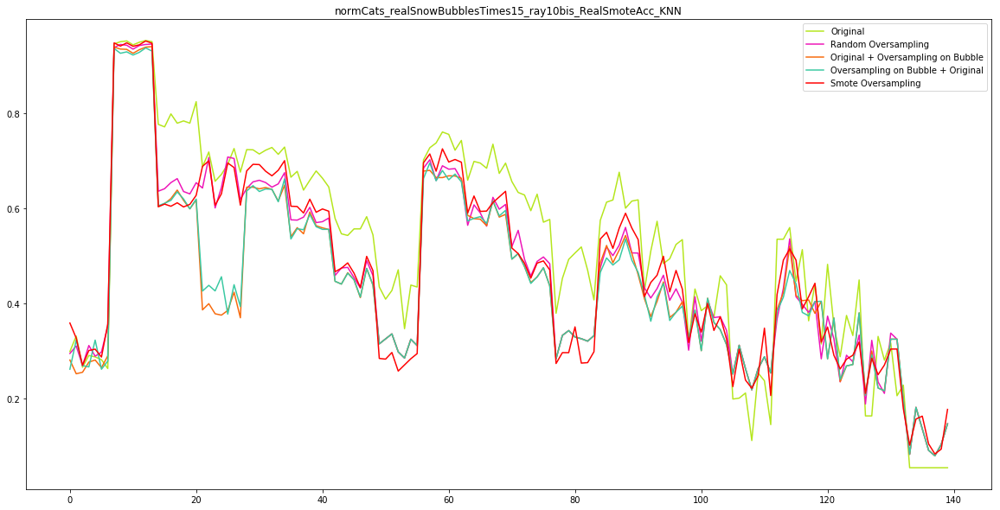

0.794751506777   -   averagePrecision   Random Forest
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteAcc_RF


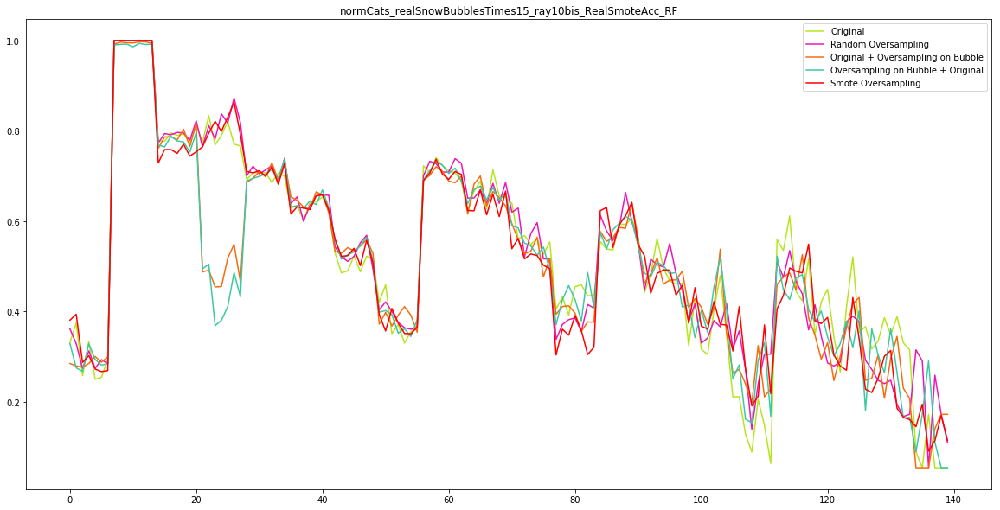

0.811715933304   -   averagePrecision   Stochastic Gradient Descent
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteAcc_SGD


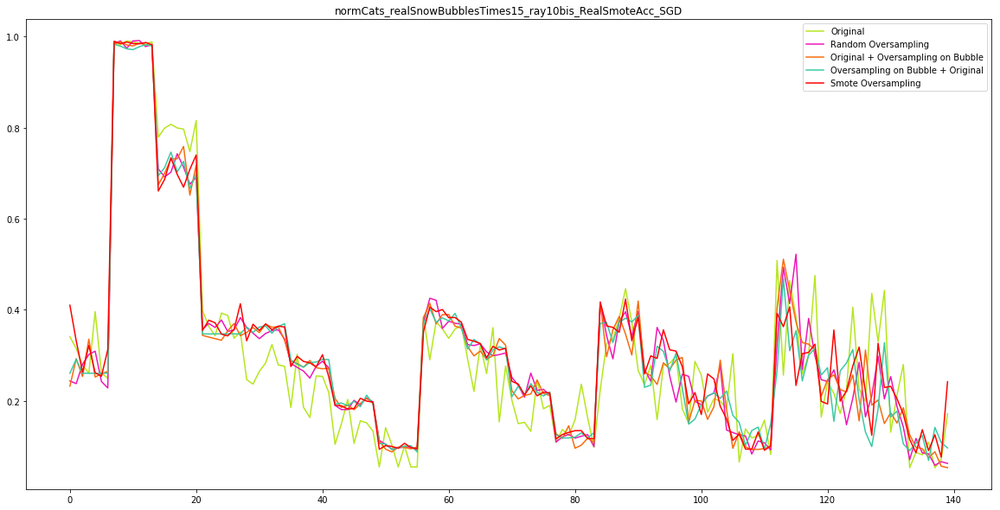

0.209121173697   -   averagePrecision   Support Vector Machine
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteAcc_SVM


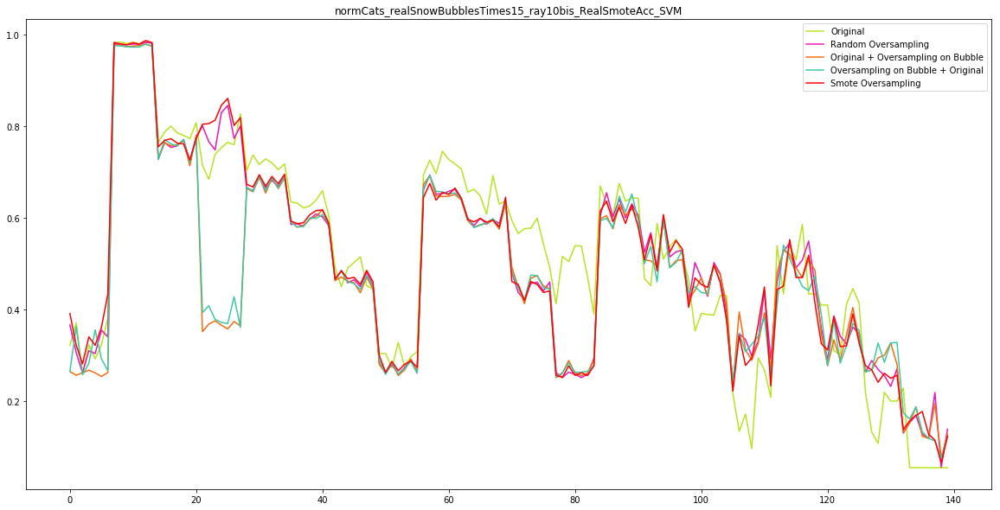

0.000337074699275   -   precision   Decision Tree
normCats_realSnowBubblesTimes15_ray10bis_RealSmotePrecs_DT


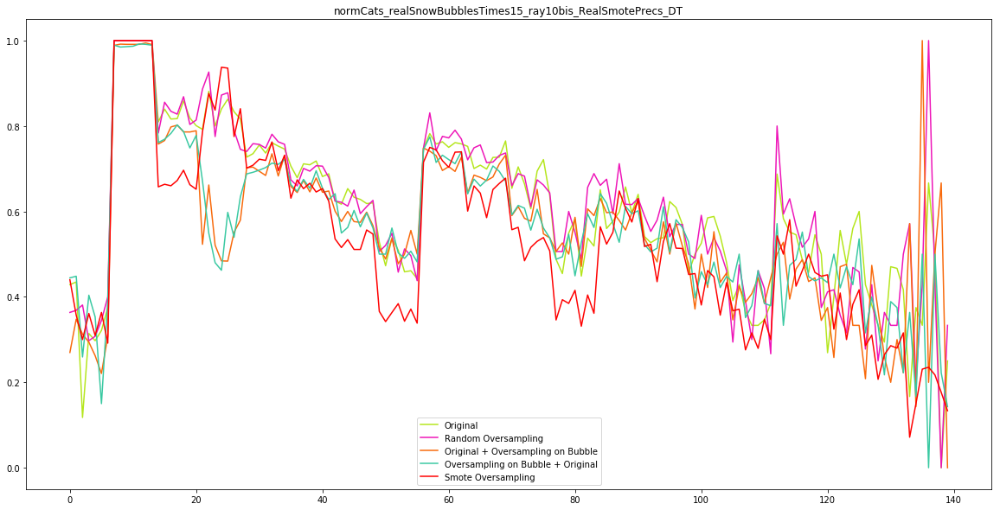

9.53869471053e-31   -   precision   KNN
normCats_realSnowBubblesTimes15_ray10bis_RealSmotePrecs_KNN


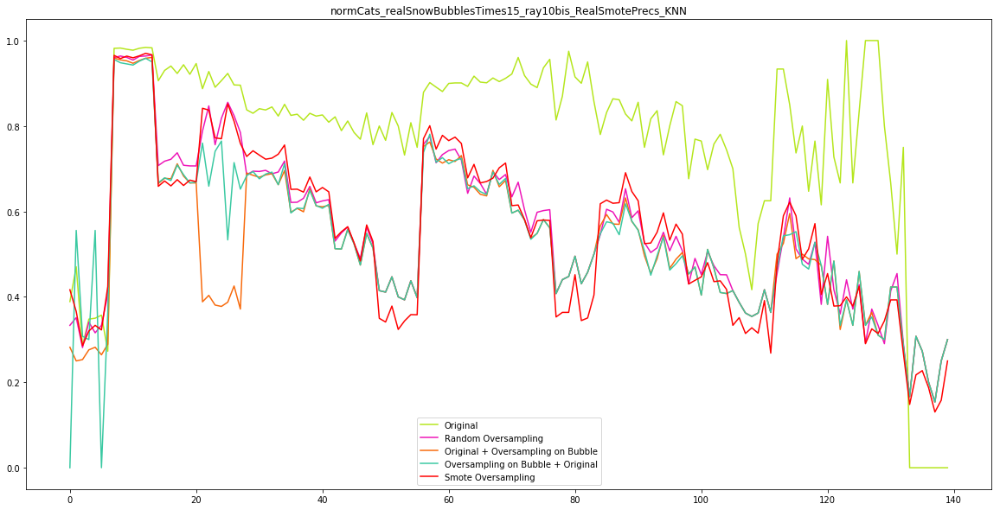

6.54525968669e-17   -   precision   Random Forest
normCats_realSnowBubblesTimes15_ray10bis_RealSmotePrecs_RF


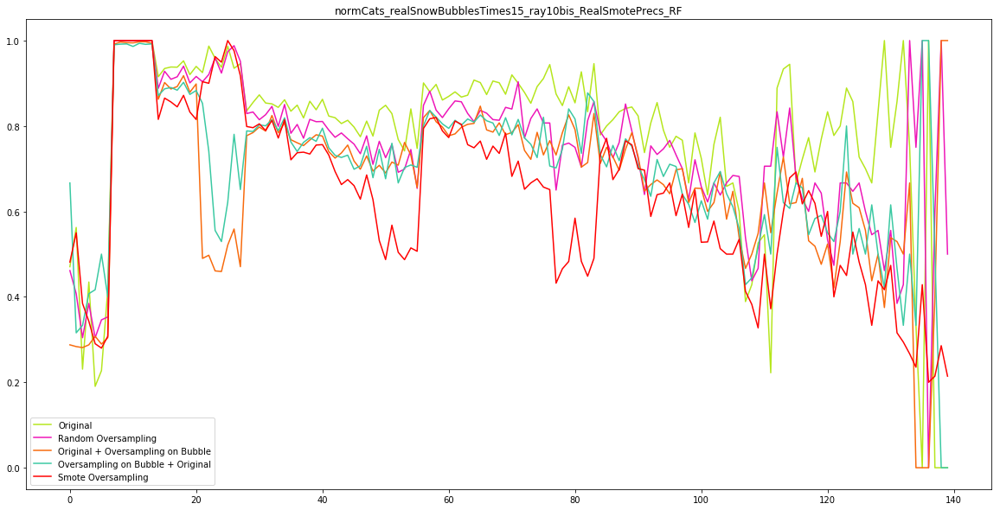

2.77347038633e-18   -   precision   Stochastic Gradient Descent
normCats_realSnowBubblesTimes15_ray10bis_RealSmotePrecs_SGD


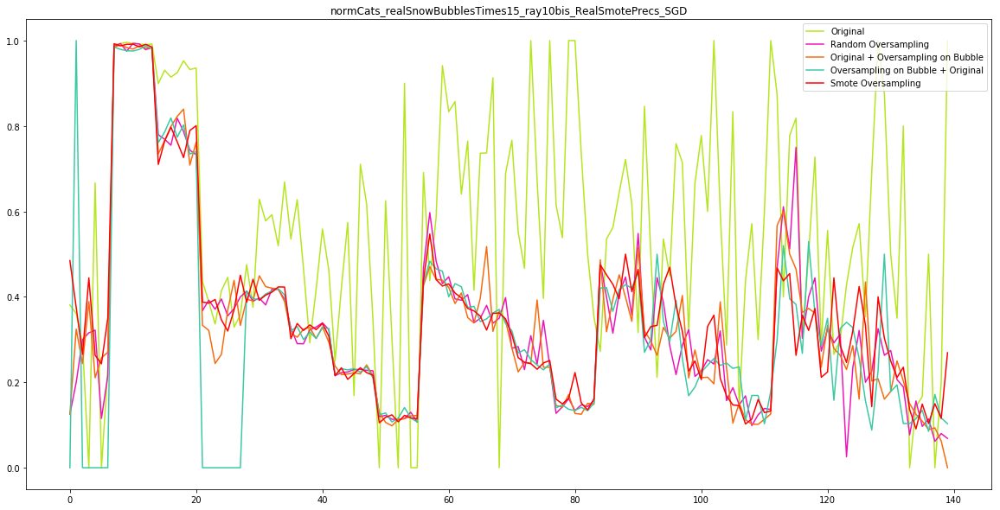

2.43975151442e-32   -   precision   Support Vector Machine
normCats_realSnowBubblesTimes15_ray10bis_RealSmotePrecs_SVM


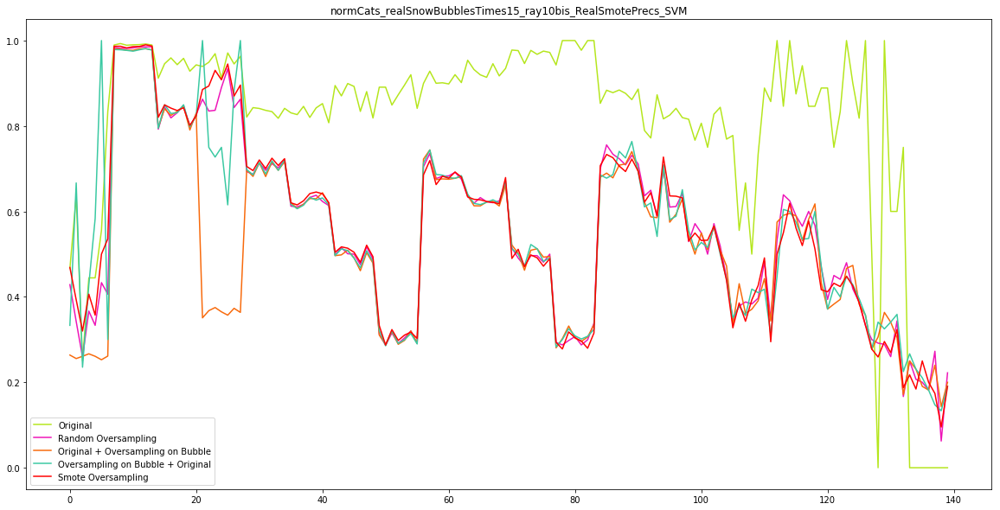

2.53965922481e-05   -   recall   Decision Tree
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteRecs_DT


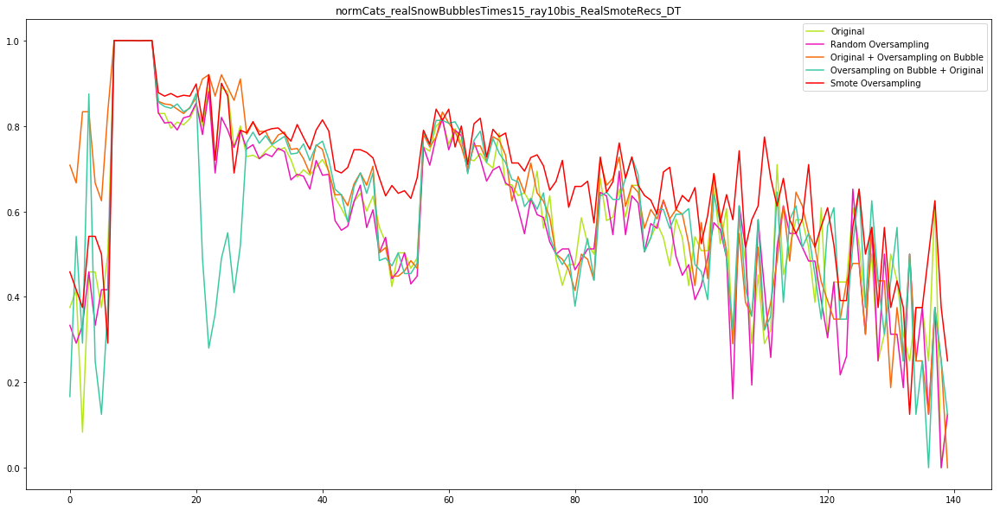

5.07691731053e-19   -   recall   KNN
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteRecs_KNN


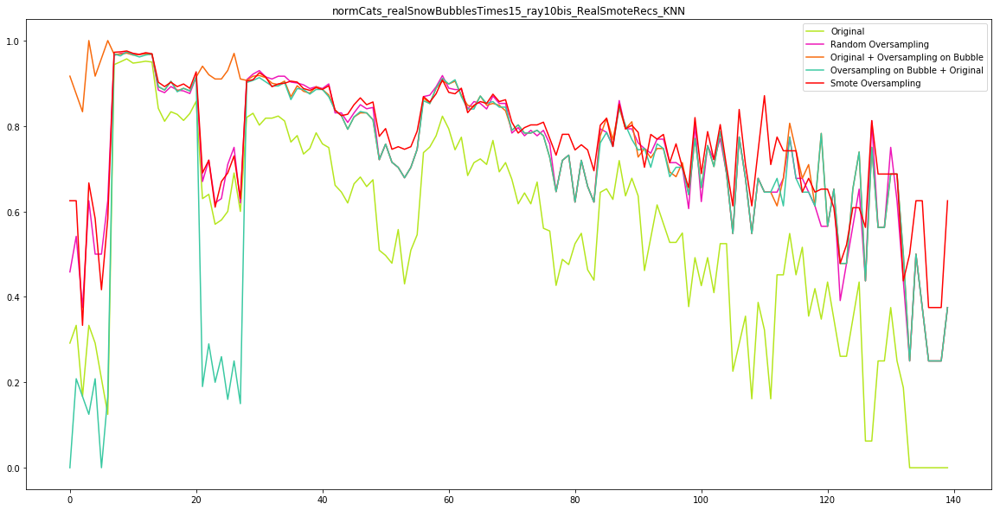

9.11993292522e-09   -   recall   Random Forest
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteRecs_RF


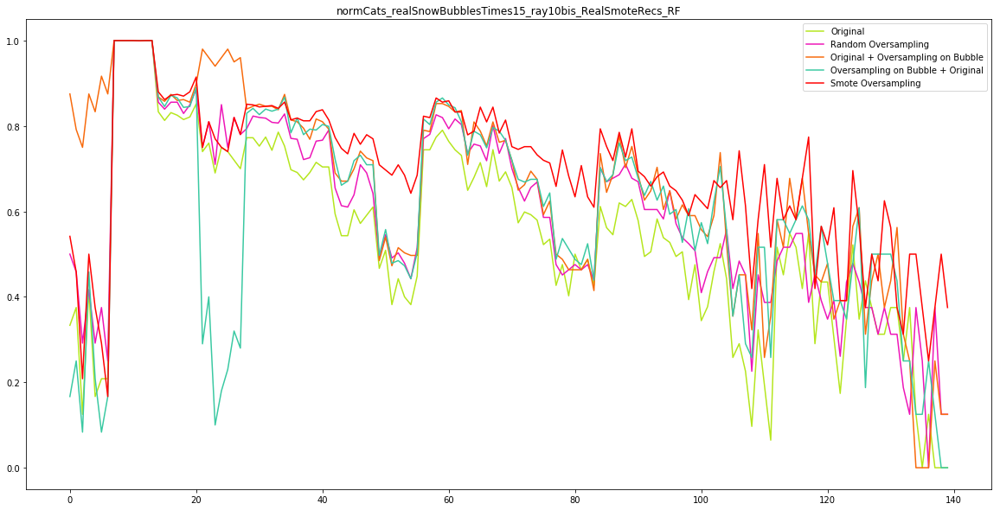

9.5632474657e-37   -   recall   Stochastic Gradient Descent
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteRecs_SGD


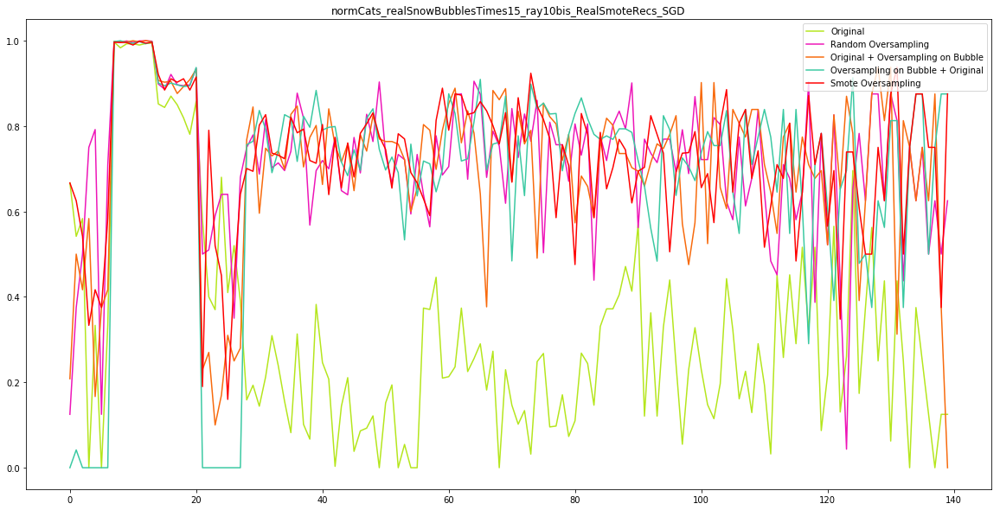

2.10801952005e-38   -   recall   Support Vector Machine
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteRecs_SVM


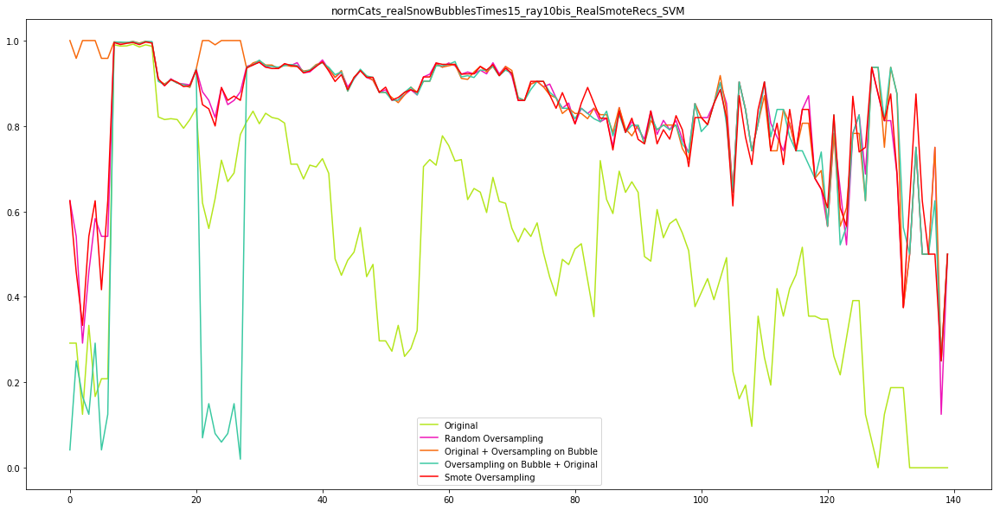

0.694374803518   -   f1 score   Decision Tree
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteF1_DT


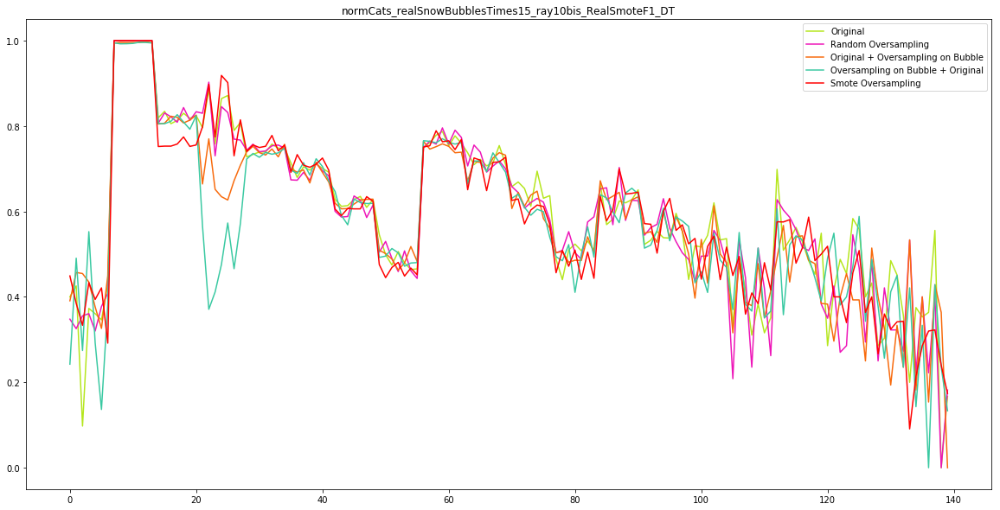

0.0465086549326   -   f1 score   KNN
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteF1_KNN


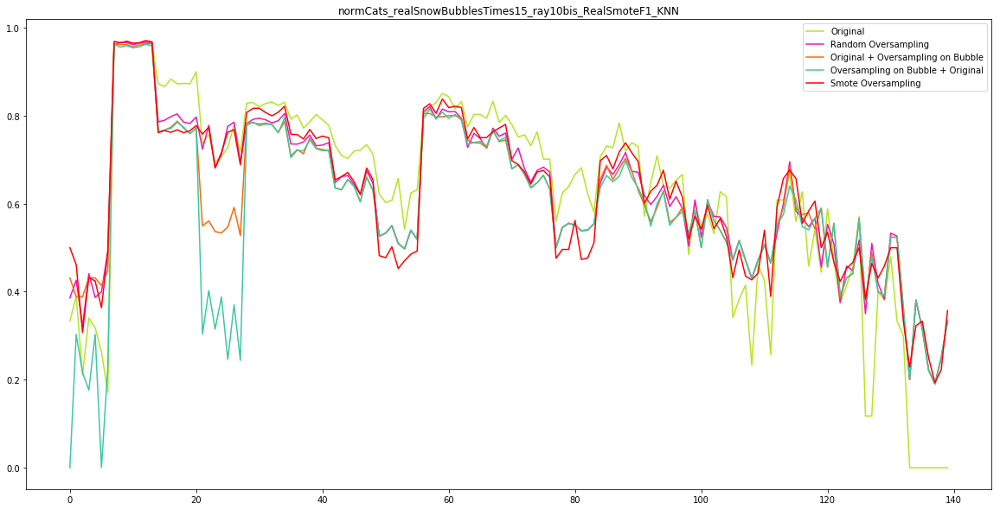

0.745978672825   -   f1 score   Random Forest
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteF1_RF


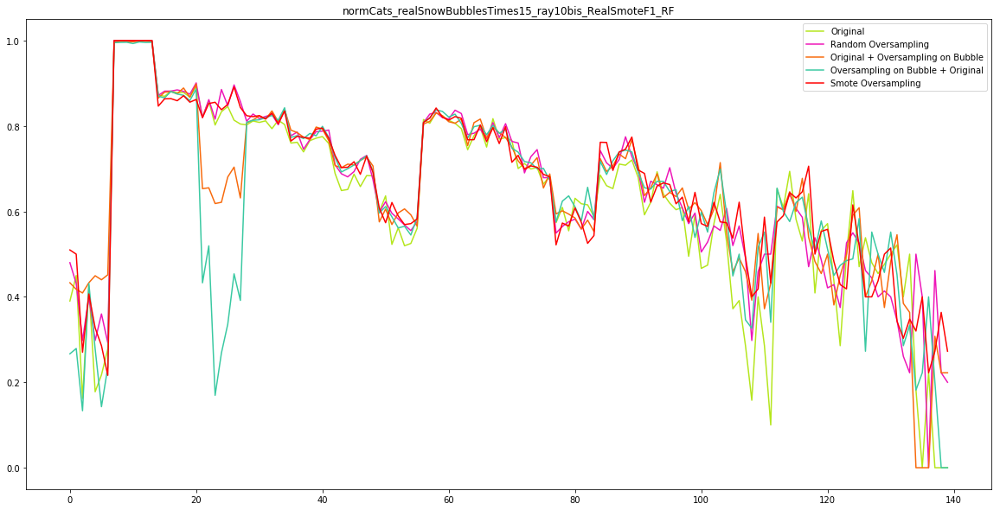

0.000123658625134   -   f1 score   Stochastic Gradient Descent
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteF1_SGD


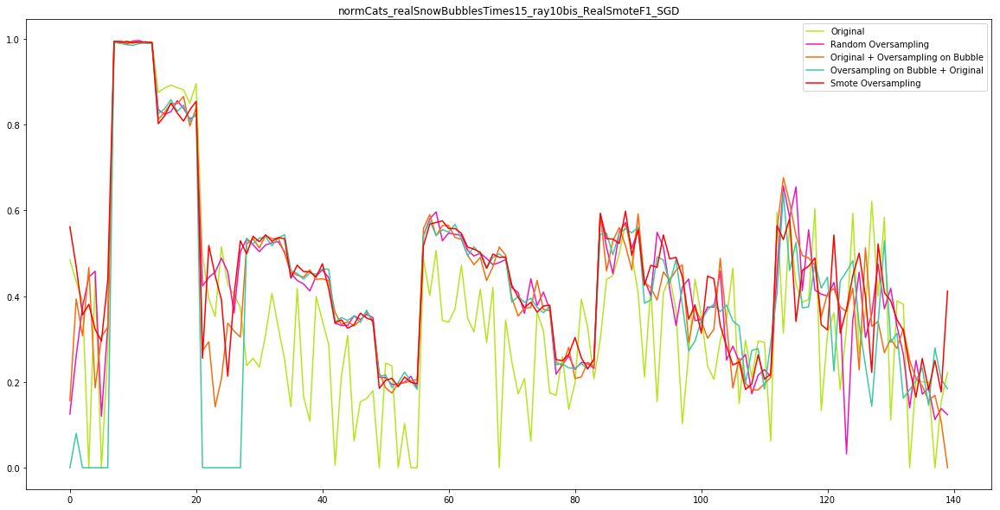

0.414170983403   -   f1 score   Support Vector Machine
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteF1_SVM


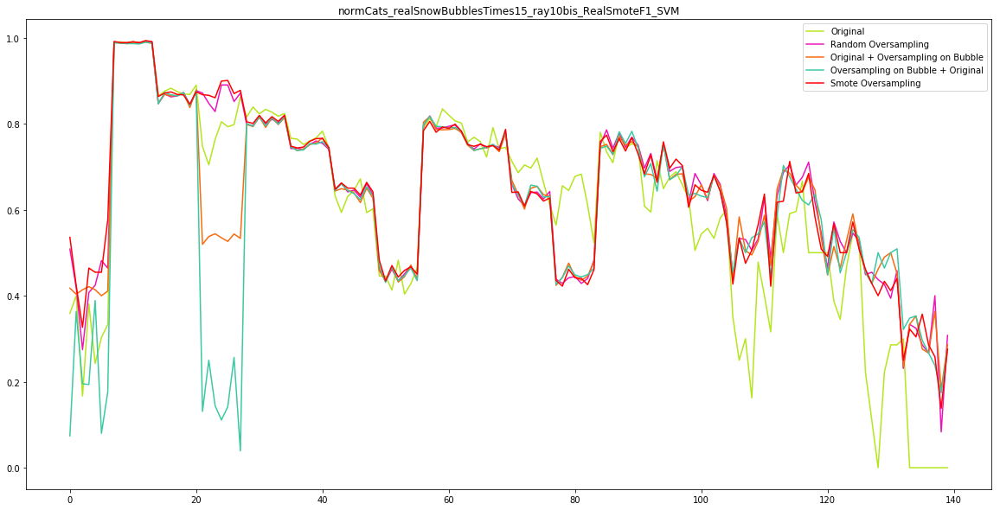

0.00805704502294   -   auc   Decision Tree
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteAUCS_DT


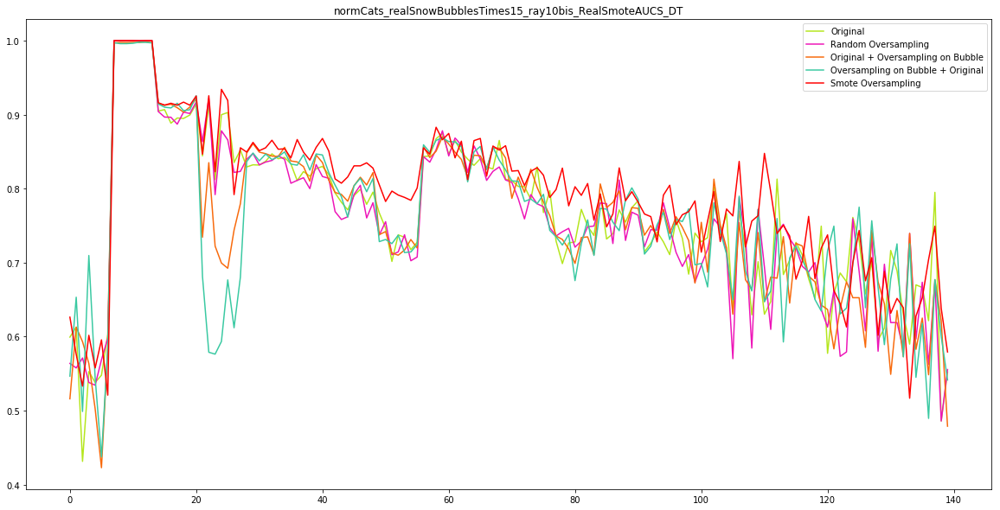

1.21670261997e-05   -   auc   KNN
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteAUCS_KNN


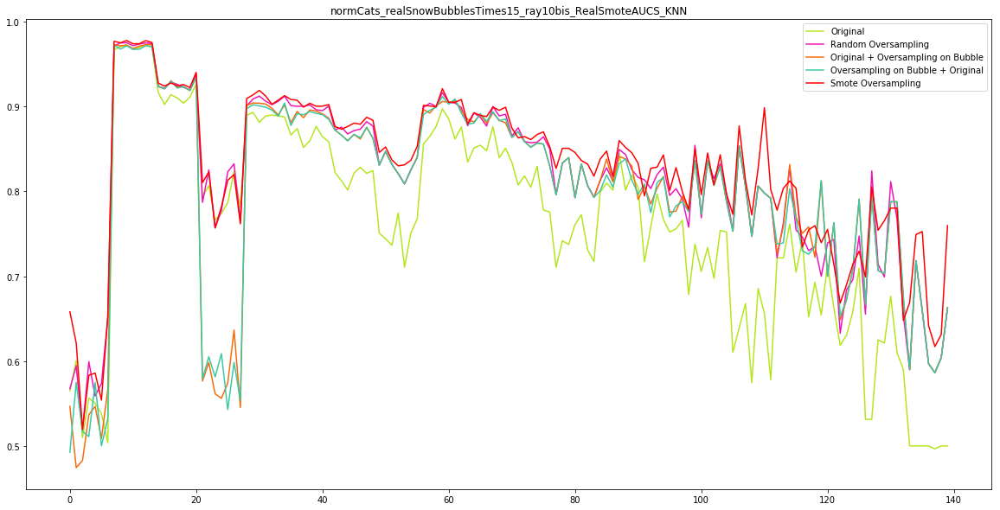

0.000305009567705   -   auc   Random Forest
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteAUCS_RF


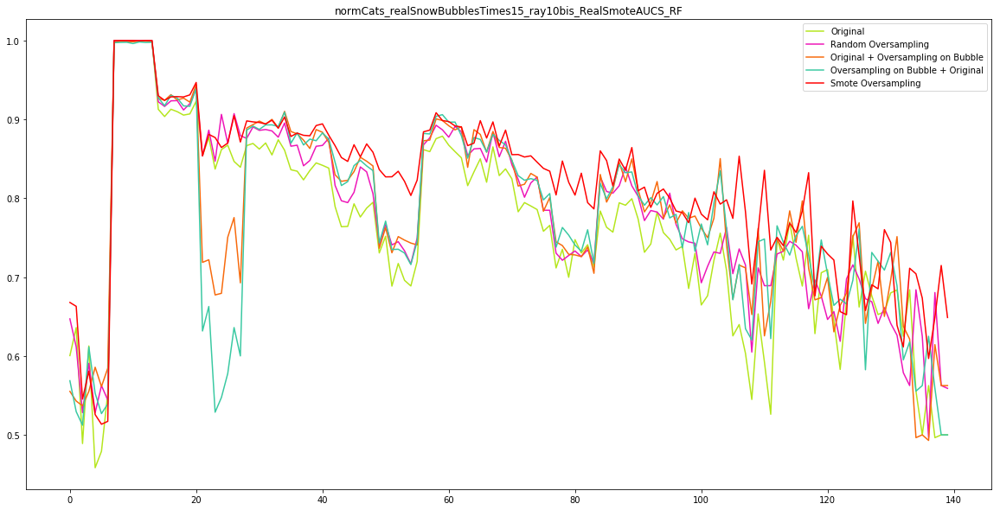

2.68197032582e-23   -   auc   Stochastic Gradient Descent
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteAUCS_SGD


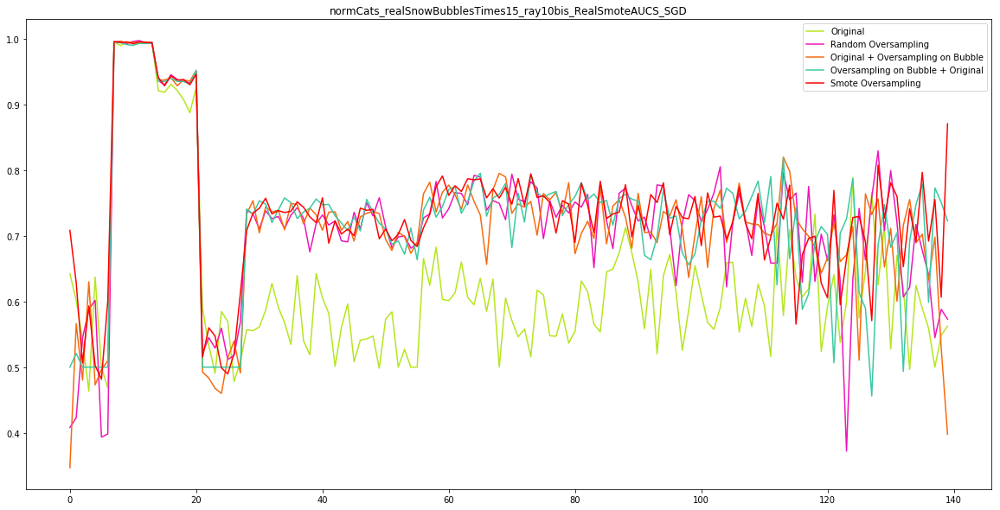

2.29167315867e-19   -   auc   Support Vector Machine
normCats_realSnowBubblesTimes15_ray10bis_RealSmoteAUCS_SVM


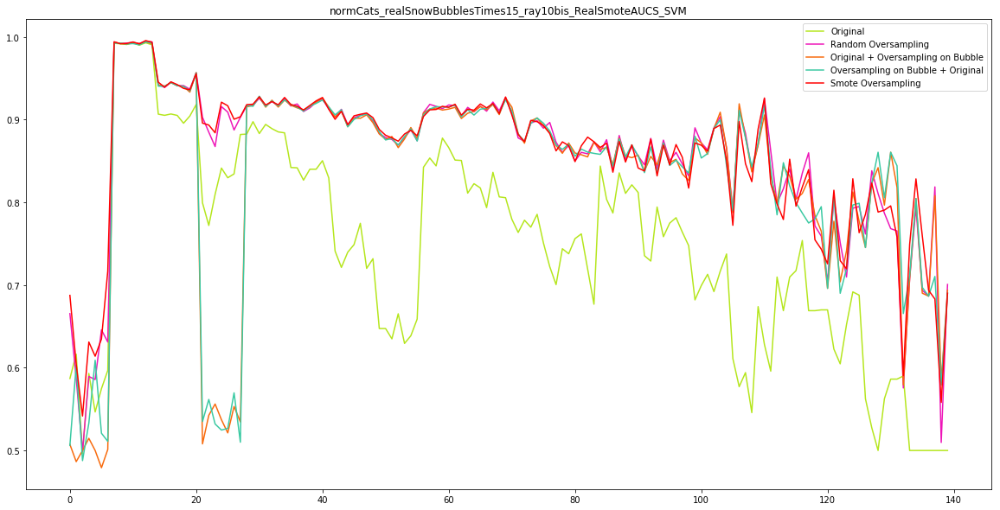

0.744771386733   -   prauc   Decision Tree
normCats_realSnowBubblesTimes15_ray10bis_RealSmotePRAUCS_DT


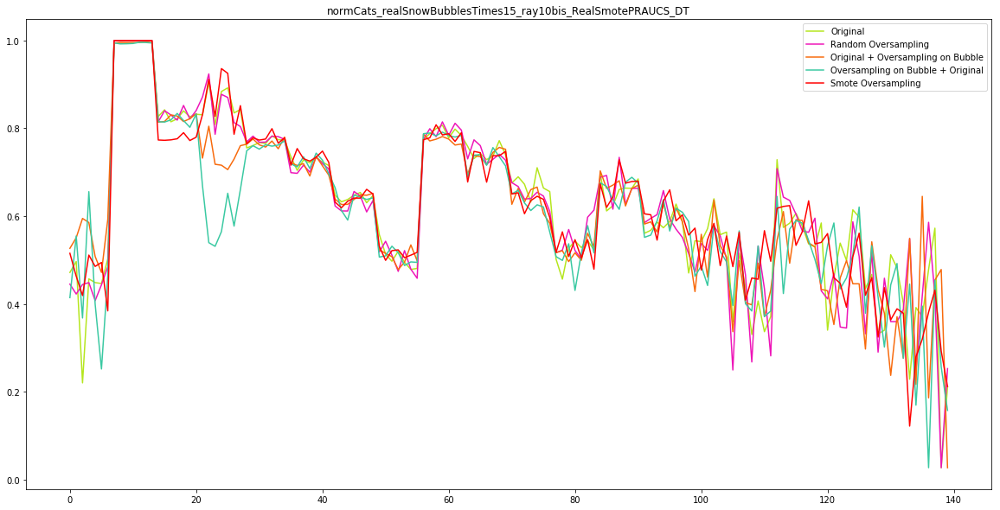

0.00407486459201   -   prauc   KNN
normCats_realSnowBubblesTimes15_ray10bis_RealSmotePRAUCS_KNN


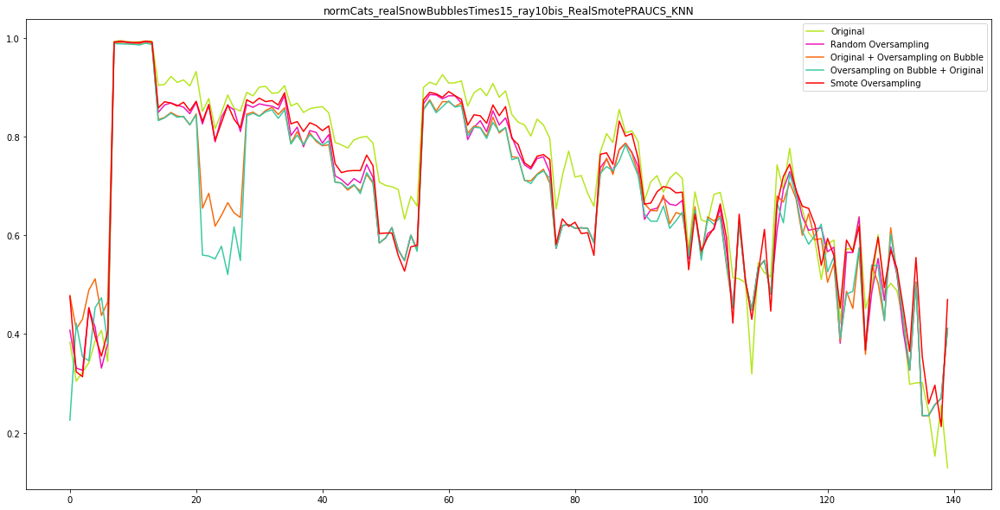

0.597403048415   -   prauc   Random Forest
normCats_realSnowBubblesTimes15_ray10bis_RealSmotePRAUCS_RF


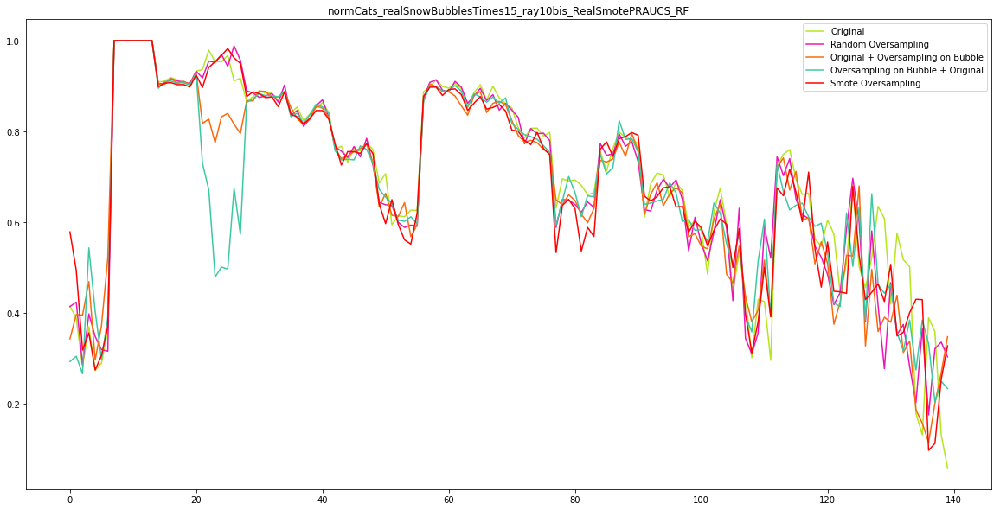

0.463485855932   -   prauc   Stochastic Gradient Descent
normCats_realSnowBubblesTimes15_ray10bis_RealSmotePRAUCS_SGD


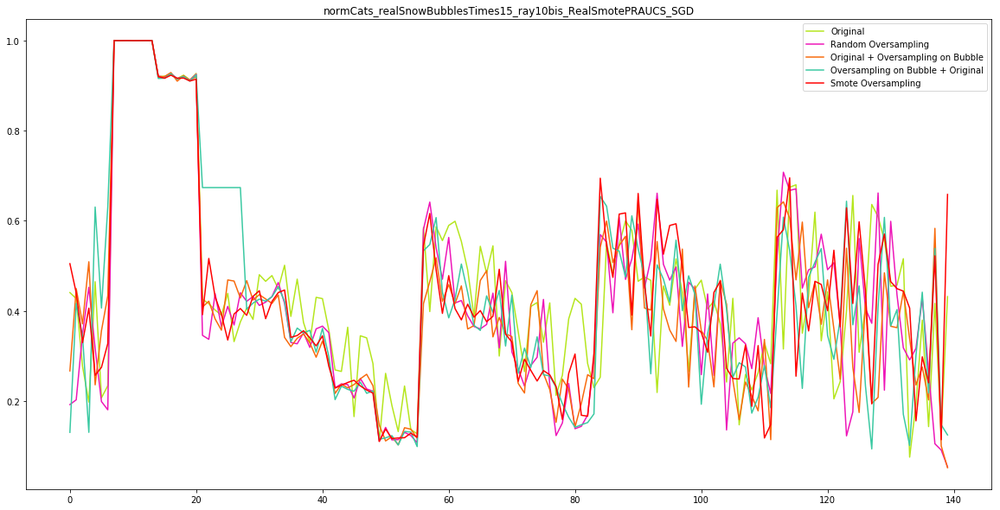

0.313428105088   -   prauc   Support Vector Machine
normCats_realSnowBubblesTimes15_ray10bis_RealSmotePRAUCS_SVM


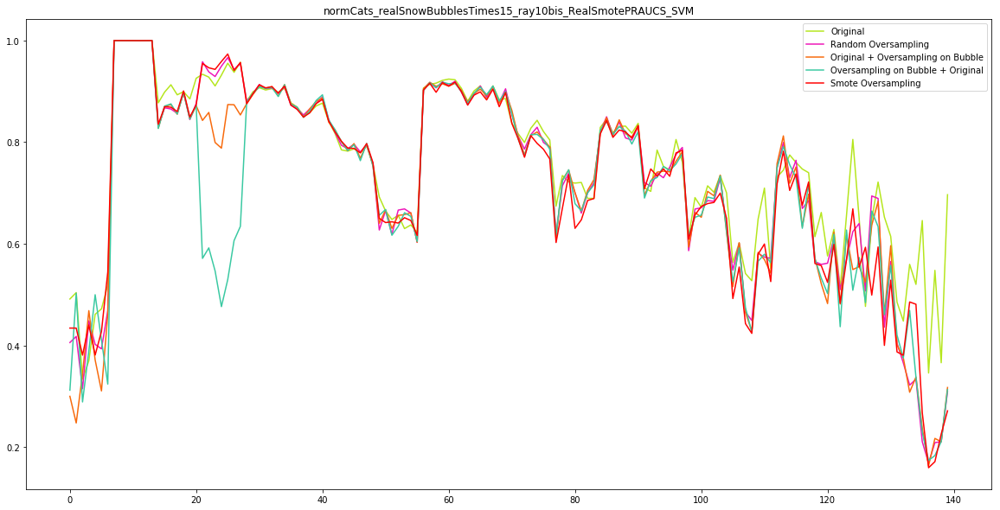

In [57]:
kruwa_averagePrecisions=[0,0,0,0,0];
kruwa_precs=[0,0,0,0,0];
kruwa_recs=[0,0,0,0,0];
kruwa_f1s=[0,0,0,0,0];
kruwa_aucs=[0,0,0,0,0];
kruwa_praucs=[0,0,0,0,0];

kw_ps_averagePrecisions=[0,0,0,0,0];
kw_ps_precs=[0,0,0,0,0];
kw_ps_recs=[0,0,0,0,0];
kw_ps_f1s=[0,0,0,0,0];
kw_ps_aucs=[0,0,0,0,0];
kw_ps_praucs=[0,0,0,0,0];

kw_stat_averagePrecisions=[0,0,0,0,0];
kw_stat_precs=[0,0,0,0,0];
kw_stat_recs=[0,0,0,0,0];
kw_stat_f1s=[0,0,0,0,0];
kw_stat_aucs=[0,0,0,0,0];
kw_stat_praucs=[0,0,0,0,0];

kruwa_measures=[kruwa_averagePrecisions, kruwa_precs, kruwa_recs, kruwa_f1s, kruwa_aucs, kruwa_praucs];
kw_ps_measures=[kw_ps_averagePrecisions, kw_ps_precs, kw_ps_recs, kw_ps_f1s, kw_ps_aucs, kw_ps_praucs];
kw_stat_measures=[kw_stat_averagePrecisions, kw_stat_precs, kw_stat_recs, kw_stat_f1s, kw_stat_aucs, kw_stat_praucs];



for measure in range(0, len(measureL_name)):
    for algorithm in range(0, len(algL_name)):
        
        
        ori = listes[measure][algorithm]['original'];
        os = listes[measure][algorithm]['oversample'];
        osbbl = listes[measure][algorithm]['oversample_bubble'];
        osbblori = listes[measure][algorithm]['oversample_bubble_original'];
        smote = listes[measure][algorithm]['smote'];

        kruwal = kruskal(ori, os, osbbl, osbblori, smote);

        kruwa_measures[measure][algorithm] = kruwal;
        kw_ps_measures[measure][algorithm] = kruwal.pvalue;
        kw_stat_measures[measure][algorithm] = kruwal.statistic;
        
        print(kruwal.pvalue, '  -  ', measureL_name[measure], ' ', algL_name[algorithm]);
        title = name_experiment+meaz[measure]+'_'+algz[algorithm];
        plot_kruskal(ori, os, osbbl, osbblori, smote, title);
    


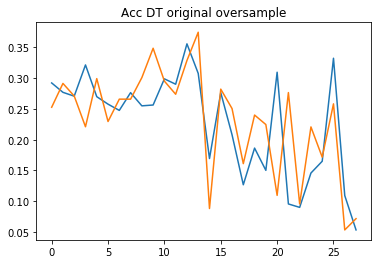

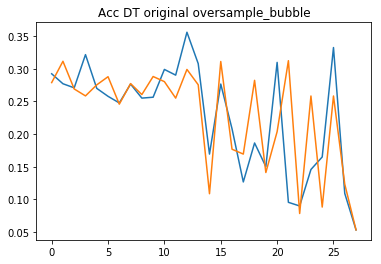

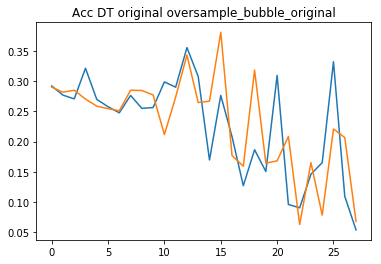

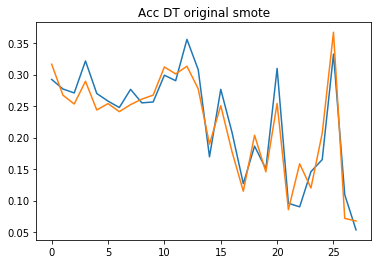

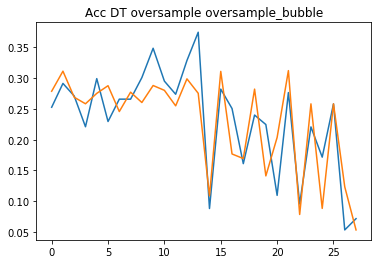

...

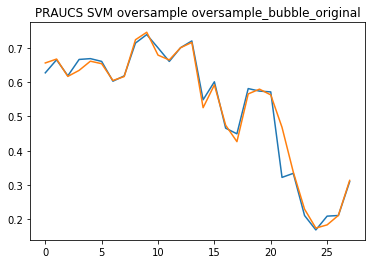

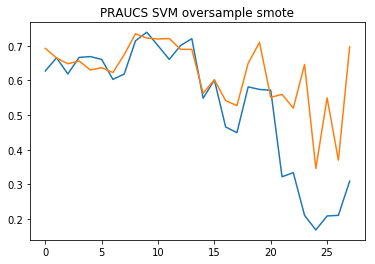

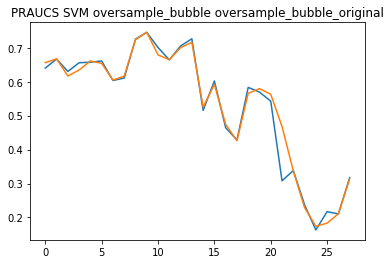

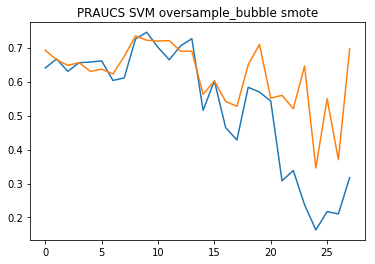

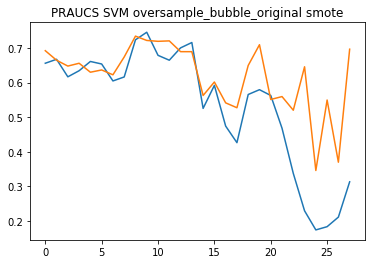

In [73]:


for measure in range(0, len(measureL_name)):
    for algorithm in range(0, len(algL_name)):
        for method1 in range(0, len(methz)):
            for method2 in range(0, len(methz)):
                
                if (str(method1)+str(method2)) in combination:
                
                    CHANGE TO 308
                    plt.plot(list(range(0, 28)), listes[measure][algorithm][methz[method1]]);
                    plt.plot(list(range(0, 28)), listes[measure][algorithm][methz[method2]]);
                    plt.title(meaz[measure]+' '+algz[algorithm]+' '+methz[method1]+' '+methz[method2]);
                    plt.savefig('../Figures/Plottings/'+name_experiment+meaz[measure]+'_'+algz[algorithm]+' '+methz[method1]+'-'+methz[method2]+'.png', format='png');
                    plt.show();


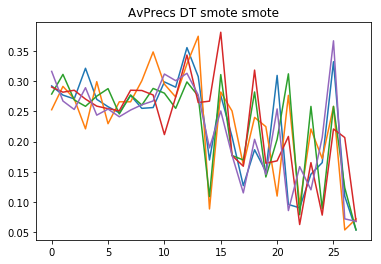

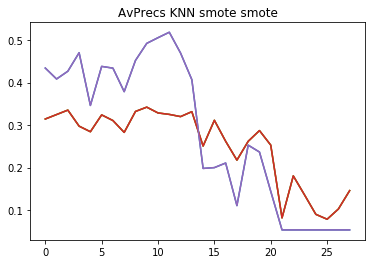

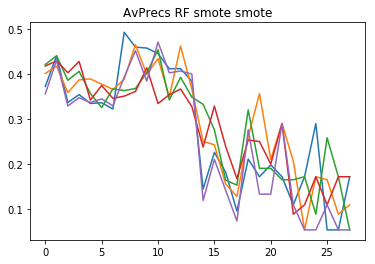

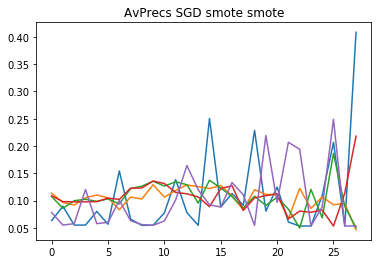

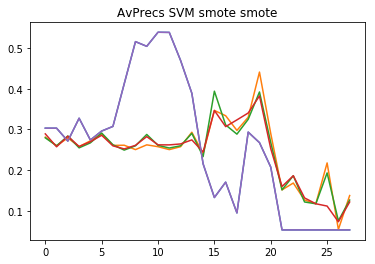

...

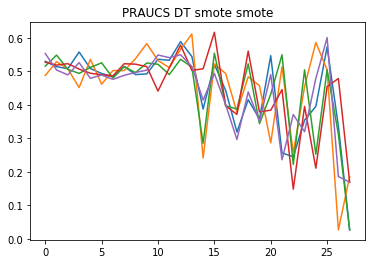

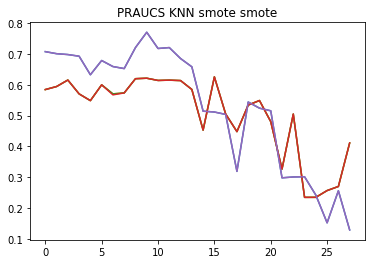

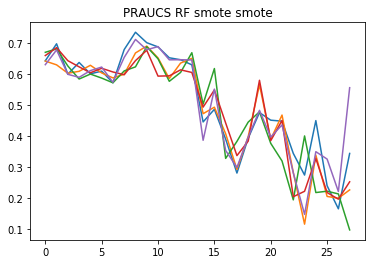

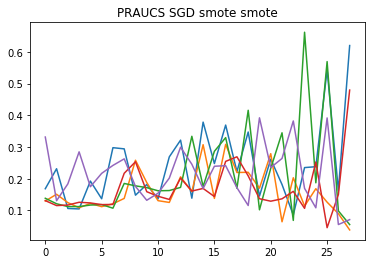

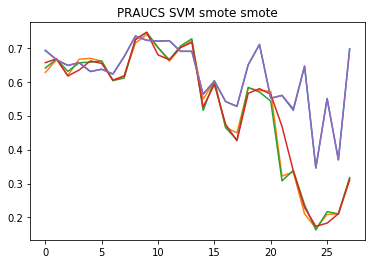

In [75]:
meaz = ['AvPrecs', 'Precs', 'Recs', 'F1', 'AUCS', 'PRAUCS'];
algz = ['DT', 'KNN', 'RF', 'SGD', 'SVM']
methz = ['original', 'oversample', 'oversample_bubble', 'oversample_bubble_original', 'smote'];
combination = ['01', '02', '03', '04', '12', '13', '14', '23', '24', '34'];


for measure in range(0, len(measureL_name)):
    for algorithm in range(0, len(algL_name)):        

        
        CHANGE 28 TO 308
        plt.plot(list(range(0, 28)), listes[measure][algorithm][methz[0]]);
        plt.plot(list(range(0, 28)), listes[measure][algorithm][methz[1]]);
        plt.plot(list(range(0, 28)), listes[measure][algorithm][methz[2]]);
        plt.plot(list(range(0, 28)), listes[measure][algorithm][methz[3]]);
        plt.plot(list(range(0, 28)), listes[measure][algorithm][methz[4]]);

        plt.title(meaz[measure]+' '+algz[algorithm]+' '+methz[method1]+' '+methz[method2]);
        plt.savefig('../Figures/Plottings/'+name_experiment+meaz[measure]+'_'+algz[algorithm]+' '+methz[method1]+'-'+methz[method2]+'.png', format='png');
        plt.show();
